Jonathan Sosa Uranga

June - July 2023

In [4]:
# Imports
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.decomposition import PCA
import seaborn as sns
from sklearn.neighbors import KNeighborsClassifier
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score
from xgboost import XGBClassifier
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import StandardScaler
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense


# FETCH DATA AND DATA ANALYSIS

In [2]:
# Load the features
features = pd.read_csv('data/features.txt', delim_whitespace=True, header=None)

# Load the activity labels
activity_labels = pd.read_csv('data/activity_labels.txt', delim_whitespace=True, header=None)

# Load training data
X_train = pd.read_csv('data/train/X_train.txt', delim_whitespace=True, header=None)
y_train = pd.read_csv('data/train/y_train.txt', delim_whitespace=True, header=None)

# Load testing data
X_test = pd.read_csv('data/test/X_test.txt', delim_whitespace=True, header=None)
y_test = pd.read_csv('data/test/y_test.txt', delim_whitespace=True, header=None)

# Load the subjects
subject_train = pd.read_csv('data/train/subject_train.txt', delim_whitespace=True, header=None)
subject_test = pd.read_csv('data/test/subject_test.txt', delim_whitespace=True, header=None)


## Features

In [3]:
print(features.head())

   0                  1
0  1  tBodyAcc-mean()-X
1  2  tBodyAcc-mean()-Y
2  3  tBodyAcc-mean()-Z
3  4   tBodyAcc-std()-X
4  5   tBodyAcc-std()-Y


## Activity Labels

In [4]:
print(activity_labels.head())

   0                   1
0  1             WALKING
1  2    WALKING_UPSTAIRS
2  3  WALKING_DOWNSTAIRS
3  4             SITTING
4  5            STANDING


## Training Sets

### X_train

In [5]:
print(X_train.head())
print('________________')
print(X_train.describe())

        0         1         2         3         4         5         6    \
0  0.288585 -0.020294 -0.132905 -0.995279 -0.983111 -0.913526 -0.995112   
1  0.278419 -0.016411 -0.123520 -0.998245 -0.975300 -0.960322 -0.998807   
2  0.279653 -0.019467 -0.113462 -0.995380 -0.967187 -0.978944 -0.996520   
3  0.279174 -0.026201 -0.123283 -0.996091 -0.983403 -0.990675 -0.997099   
4  0.276629 -0.016570 -0.115362 -0.998139 -0.980817 -0.990482 -0.998321   

        7         8         9    ...       551       552       553       554  \
0 -0.983185 -0.923527 -0.934724  ... -0.074323 -0.298676 -0.710304 -0.112754   
1 -0.974914 -0.957686 -0.943068  ...  0.158075 -0.595051 -0.861499  0.053477   
2 -0.963668 -0.977469 -0.938692  ...  0.414503 -0.390748 -0.760104 -0.118559   
3 -0.982750 -0.989302 -0.938692  ...  0.404573 -0.117290 -0.482845 -0.036788   
4 -0.979672 -0.990441 -0.942469  ...  0.087753 -0.351471 -0.699205  0.123320   

        555       556       557       558       559       560  
0  0

### y_train

In [6]:
print(y_train.head())
print('________________')
print(y_train.describe())

   0
0  5
1  5
2  5
3  5
4  5
________________
                 0
count  7352.000000
mean      3.643362
std       1.744802
min       1.000000
25%       2.000000
50%       4.000000
75%       5.000000
max       6.000000


## TEST DATA

### X_test

In [7]:
print(X_test.head())
print('________________')
print(X_test.describe())

        0         1         2         3         4         5         6    \
0  0.257178 -0.023285 -0.014654 -0.938404 -0.920091 -0.667683 -0.952501   
1  0.286027 -0.013163 -0.119083 -0.975415 -0.967458 -0.944958 -0.986799   
2  0.275485 -0.026050 -0.118152 -0.993819 -0.969926 -0.962748 -0.994403   
3  0.270298 -0.032614 -0.117520 -0.994743 -0.973268 -0.967091 -0.995274   
4  0.274833 -0.027848 -0.129527 -0.993852 -0.967445 -0.978295 -0.994111   

        7         8         9    ...       551       552       553       554  \
0 -0.925249 -0.674302 -0.894088  ...  0.071645 -0.330370 -0.705974  0.006462   
1 -0.968401 -0.945823 -0.894088  ... -0.401189 -0.121845 -0.594944 -0.083495   
2 -0.970735 -0.963483 -0.939260  ...  0.062891 -0.190422 -0.640736 -0.034956   
3 -0.974471 -0.968897 -0.938610  ...  0.116695 -0.344418 -0.736124 -0.017067   
4 -0.965953 -0.977346 -0.938610  ... -0.121711 -0.534685 -0.846595 -0.002223   

        555       556       557       558       559       560  
0  0

### y_test

In [8]:
print(y_test.head())
print('________________')
print(y_test.describe())

   0
0  5
1  5
2  5
3  5
4  5
________________
                 0
count  2947.000000
mean      3.577876
std       1.740348
min       1.000000
25%       2.000000
50%       4.000000
75%       5.000000
max       6.000000


## Subject Train

### Subject Train

In [9]:
print(subject_train.head())
print('________________')
print(subject_train.describe())

   0
0  1
1  1
2  1
3  1
4  1
________________
                 0
count  7352.000000
mean     17.413085
std       8.975143
min       1.000000
25%       8.000000
50%      19.000000
75%      26.000000
max      30.000000


### Subject Test

In [10]:
print(subject_test.head())
print('________________')
print(subject_test.describe())

   0
0  2
1  2
2  2
3  2
4  2
________________
                 0
count  2947.000000
mean     12.986427
std       6.950984
min       2.000000
25%       9.000000
50%      12.000000
75%      18.000000
max      24.000000


## Graphs

Training data shape:  (7352, 562)
Test data shape:  (2947, 562)
Are there missing values in the training data?  False
Are there missing values in the test data?  False


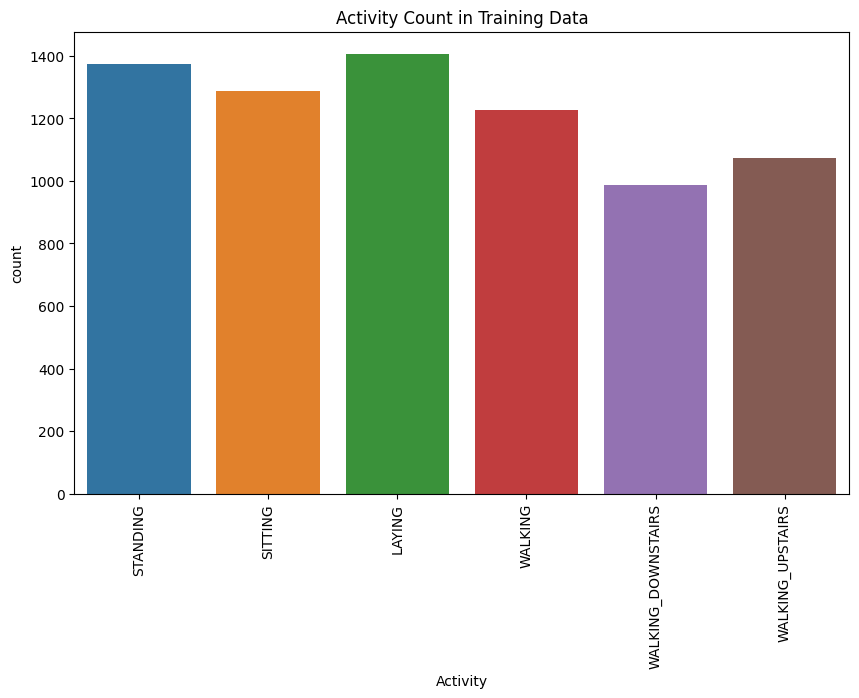

In [11]:
# Assign column names based on features.txt
X_train.columns = features.iloc[:, 1]
X_test.columns = features.iloc[:, 1]

# Add activity label to train and test dataframes
X_train['Activity'] = y_train
X_test['Activity'] = y_test

# Replace activity numbers with actual activity labels
activity_labels_dict = activity_labels.set_index(0).to_dict()[1]
X_train['Activity'] = X_train['Activity'].replace(activity_labels_dict)
X_test['Activity'] = X_test['Activity'].replace(activity_labels_dict)

# Check the shape of the data
print("Training data shape: ", X_train.shape)
print("Test data shape: ", X_test.shape)

# Check if any missing values
print("Are there missing values in the training data? ", X_train.isnull().values.any())
print("Are there missing values in the test data? ", X_test.isnull().values.any())

# Plot the distribution of activities in the training data
plt.figure(figsize=(10,6))
sns.countplot(x='Activity', data=X_train)
plt.title('Activity Count in Training Data')
plt.xticks(rotation=90)
plt.show()

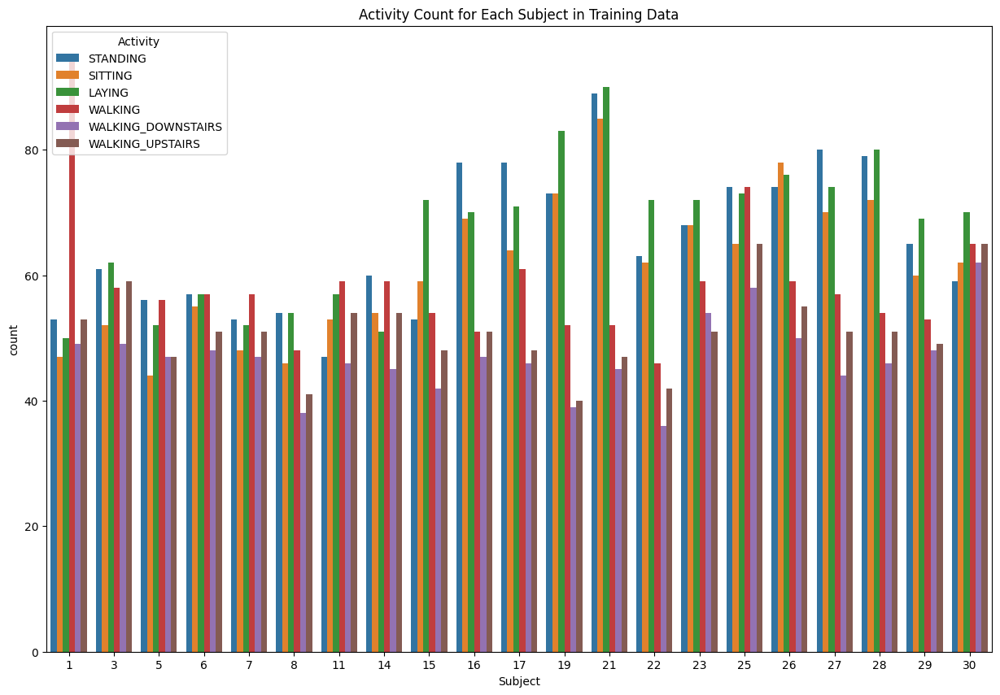

In [12]:
# Add activity label and subject to train and test dataframes
X_train['Subject'] = subject_train
X_test['Subject'] = subject_test

# Plot the distribution of activities for each subject in the training data
plt.figure(figsize=(15,10))
sns.countplot(data=X_train, x='Subject', hue='Activity')
plt.title('Activity Count for Each Subject in Training Data')
plt.show()

### Load the data again so it doesnt have labels

In [13]:
# Load the features
features = pd.read_csv('data/features.txt', delim_whitespace=True, header=None)

# Load the activity labels
activity_labels = pd.read_csv('data/activity_labels.txt', delim_whitespace=True, header=None)

# Load training data
X_train = pd.read_csv('data/train/X_train.txt', delim_whitespace=True, header=None)
y_train = pd.read_csv('data/train/y_train.txt', delim_whitespace=True, header=None)

# Load testing data
X_test = pd.read_csv('data/test/X_test.txt', delim_whitespace=True, header=None)
y_test = pd.read_csv('data/test/y_test.txt', delim_whitespace=True, header=None)

# Load the subjects
subject_train = pd.read_csv('data/train/subject_train.txt', delim_whitespace=True, header=None)
subject_test = pd.read_csv('data/test/subject_test.txt', delim_whitespace=True, header=None)


# PCA

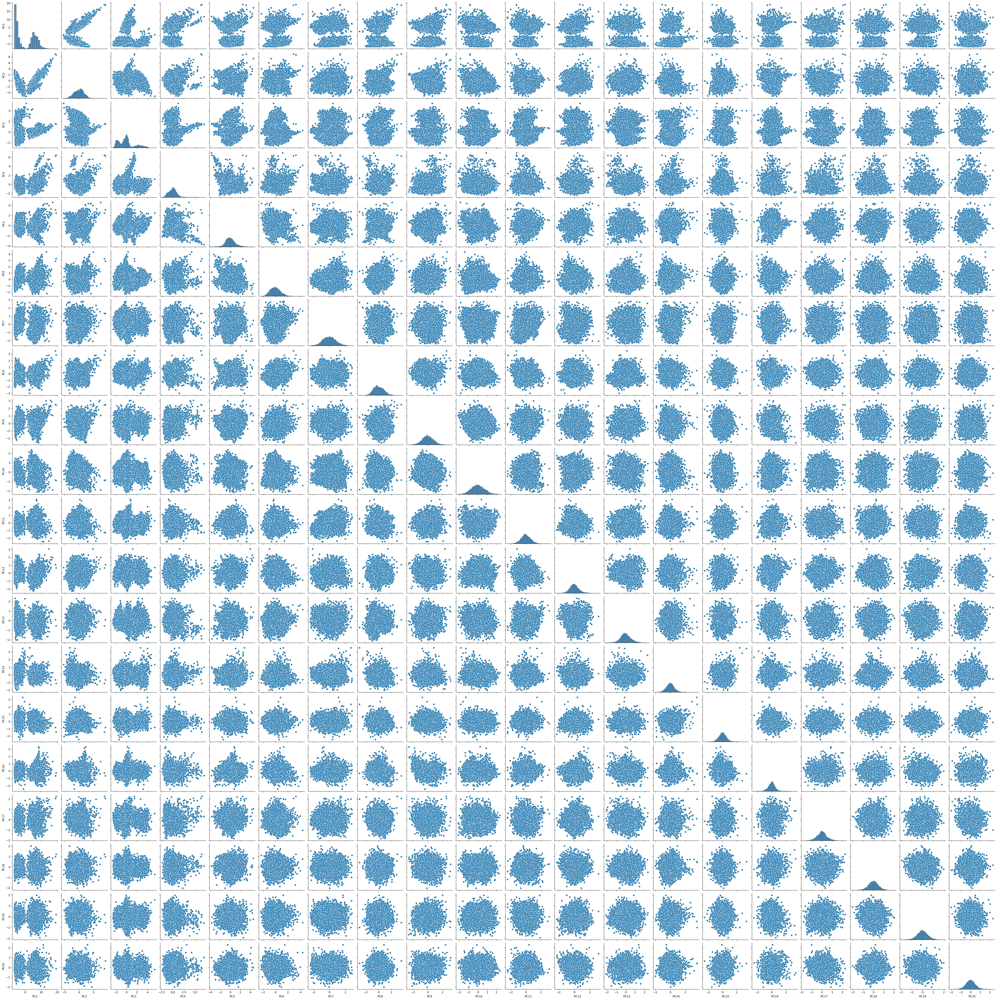

In [34]:
# Assuming X_train is your training data
pca = PCA(n_components=20)  # We are reducing to 20 dimensions
X_train_pca = pca.fit_transform(X_train)
X_test_pca = pca.transform(X_test)

# Convert NumPy array to DataFrame
X_train_pca_df = pd.DataFrame(X_train_pca, columns=[f"PC{i+1}" for i in range(X_train_pca.shape[1])])

# Create the pairplot
sns.pairplot(X_train_pca_df)

# KNN Model

### KNN non PCA

In [38]:
accuarcies=[]
neighbors=[]
for i in range(50):
    # Initialize the scaler and fit it to the training data
    scaler = StandardScaler()
    X_train_scaled = scaler.fit_transform(X_train)
    X_test_scaled = scaler.transform(X_test)

    # Initialize the KNeighborsClassifier, 6 for each number of state
    knn = KNeighborsClassifier(n_neighbors=(i+1))

    # Fit the model
    knn.fit(X_train_scaled, y_train.values.ravel())

    # Make predictions
    y_pred = knn.predict(X_test_scaled)

    # Evaluate the model
    print("Classification Report:")
    print(classification_report(y_test, y_pred))

    print("Confusion Matrix:")
    print(confusion_matrix(y_test, y_pred))

    print("Accuracy:")
    print(accuracy_score(y_test, y_pred) * 100)
    accuarcies.append(accuracy_score(y_test, y_pred) * 100)
    neighbors.append(i+1)



Classification Report:
              precision    recall  f1-score   support

           0       0.82      0.96      0.88       496
           1       0.88      0.89      0.89       471
           2       0.92      0.73      0.81       420
           3       0.79      0.72      0.75       491
           4       0.76      0.87      0.81       532
           5       1.00      0.93      0.96       537

    accuracy                           0.85      2947
   macro avg       0.86      0.85      0.85      2947
weighted avg       0.86      0.85      0.85      2947

Confusion Matrix:
[[474   5  17   0   0   0]
 [ 39 421  11   0   0   0]
 [ 64  51 305   0   0   0]
 [  0   1   0 354 134   2]
 [  0   0   0  68 464   0]
 [  0   0   0  28  12 497]]
Accuracy:
85.34102477095351
Classification Report:
              precision    recall  f1-score   support

           0       0.75      0.98      0.85       496
           1       0.83      0.84      0.84       471
           2       0.97      0.60      

### KNN PCA Data

In [35]:
accuarcies_PCA=[]

for i in range(50):
    # Initialize the scaler and fit it to the training data
    scaler = StandardScaler()
    X_train_scaled = scaler.fit_transform(X_train)
    X_test_scaled = scaler.transform(X_test)

    # Initialize the KNeighborsClassifier, 6 for each number of state
    knn = KNeighborsClassifier(n_neighbors=(i+1))

    # Fit the model
    knn.fit(X_train_pca, y_train.values.ravel())

    # Make predictions
    y_pred = knn.predict(X_test_pca)

    # Evaluate the model
    print("Classification Report:")
    print(classification_report(y_test, y_pred))

    print("Confusion Matrix:")
    print(confusion_matrix(y_test, y_pred))

    print("Accuracy:")
    print(accuracy_score(y_test, y_pred) * 100)
    accuarcies_PCA.append(accuracy_score(y_test, y_pred) * 100)


Classification Report:
              precision    recall  f1-score   support

           0       0.84      0.90      0.87       496
           1       0.84      0.88      0.86       471
           2       0.84      0.73      0.78       420
           3       0.71      0.72      0.72       491
           4       0.76      0.78      0.77       532
           5       1.00      0.96      0.98       537

    accuracy                           0.83      2947
   macro avg       0.83      0.83      0.83      2947
weighted avg       0.83      0.83      0.83      2947

Confusion Matrix:
[[445  17  34   0   0   0]
 [ 32 414  25   0   0   0]
 [ 55  59 306   0   0   0]
 [  0   2   0 354 134   1]
 [  0   0   0 119 413   0]
 [  0   0   0  23   0 514]]
Accuracy:
82.9996606718697
Classification Report:
              precision    recall  f1-score   support

           0       0.77      0.95      0.85       496
           1       0.84      0.86      0.85       471
           2       0.92      0.63      0

## Accuarcy Graph

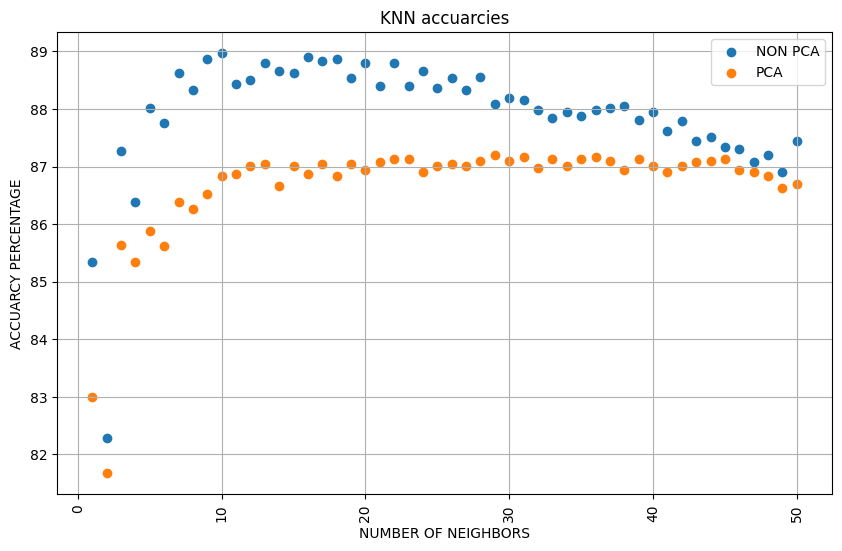

In [45]:
plt.figure(figsize=(10,6))
plt.title("KNN accuarcies")
plt.scatter(neighbors, accuarcies, label="NON PCA")
plt.scatter(neighbors, accuarcies_PCA, label="PCA")
plt.xlabel("NUMBER OF NEIGHBORS")
plt.ylabel("ACCUARCY PERCENTAGE")
plt.xticks(rotation=90)
plt.legend()
plt.grid(True)

plt.show()

# XGBoost Classifier

In [33]:
# Create an XGBoost classifier
model = XGBClassifier(use_label_encoder=False)

# Subtract 1 from the labels so they start from 0
y_train = y_train - 1
y_test = y_test - 1

# Then, you can fit the model as before
model.fit(X_train, y_train)

# Make predictions on the test data
y_pred = model.predict(X_test)

# Since we subtracted 1 from the labels, we need to add 1 back to the predictions for them to make sense in your original problem context
y_pred = y_pred + 1

# Calculate the accuracy of the model
accuracy = accuracy_score(y_test, y_pred)
print("Accuracy: %.2f%%" % (accuracy * 100.0))

Accuracy: 2.82%


# Neural Network (MLP)

## Models creation

### 2 layers i number of nodes, relu activation

In [47]:
no_nodes=[]
losses_2nodes=[]
accuarcies_2nodes=[]

for i in range(100):   
    # Encode the labels to integers
    le = LabelEncoder()
    y_train_encoded = le.fit_transform(y_train.values.ravel())
    y_test_encoded = le.transform(y_test.values.ravel())

    # Convert the integer encoded labels to one-hot vectors
    y_train_onehot = to_categorical(y_train_encoded)
    y_test_onehot = to_categorical(y_test_encoded)

    # Standardize the features
    scaler = StandardScaler()
    X_train_scaled = scaler.fit_transform(X_train)
    X_test_scaled = scaler.transform(X_test)

    # Define the model
    model = Sequential()
    model.add(Dense(20+i, input_dim=X_train_scaled.shape[1], activation='relu'))  # Input layer
    model.add(Dense(20+i, activation='relu'))  # Hidden layer 1
    model.add(Dense(20+i, activation='relu'))  # Hidden layer 2
    model.add(Dense(y_train_onehot.shape[1], activation='softmax'))  # Output layer

    # Compile the model
    model.compile(loss='categorical_crossentropy', optimizer='adam', metrics=['accuracy'])

    # Train the model
    model.fit(X_train_scaled, y_train_onehot, epochs=10, batch_size=32, validation_data=(X_test_scaled, y_test_onehot))

    # Evaluate the model
    loss, accuracy = model.evaluate(X_test_scaled, y_test_onehot)
    losses_2nodes.append(loss)
    accuarcies_2nodes.append(accuracy)
    no_nodes.append(20+i)



Epoch 1/10
230/230 [==============================] - 0s 809us/step - loss: 0.4734 - accuracy: 0.8194 - val_loss: 0.2225 - val_accuracy: 0.9067
Epoch 2/10
230/230 [==============================] - 0s 528us/step - loss: 0.1047 - accuracy: 0.9627 - val_loss: 0.1947 - val_accuracy: 0.9267
Epoch 3/10
230/230 [==============================] - 0s 526us/step - loss: 0.0746 - accuracy: 0.9725 - val_loss: 0.1913 - val_accuracy: 0.9277
Epoch 4/10
230/230 [==============================] - 0s 542us/step - loss: 0.0561 - accuracy: 0.9788 - val_loss: 0.1810 - val_accuracy: 0.9335
Epoch 5/10
230/230 [==============================] - 0s 590us/step - loss: 0.0579 - accuracy: 0.9789 - val_loss: 0.2086 - val_accuracy: 0.9291
Epoch 6/10
230/230 [==============================] - 0s 601us/step - loss: 0.0479 - accuracy: 0.9822 - val_loss: 0.1857 - val_accuracy: 0.9355
Epoch 7/10
230/230 [==============================] - 0s 547us/step - loss: 0.0419 - accuracy: 0.9846 - val_loss: 0.1914 - val_accuracy:

### 1 layer i number of nodes, relu activation

In [48]:
losses_1nodes=[]
accuarcies_1nodes=[]

for i in range(100):   
    # Encode the labels to integers
    le = LabelEncoder()
    y_train_encoded = le.fit_transform(y_train.values.ravel())
    y_test_encoded = le.transform(y_test.values.ravel())

    # Convert the integer encoded labels to one-hot vectors
    y_train_onehot = to_categorical(y_train_encoded)
    y_test_onehot = to_categorical(y_test_encoded)

    # Standardize the features
    scaler = StandardScaler()
    X_train_scaled = scaler.fit_transform(X_train)
    X_test_scaled = scaler.transform(X_test)

    # Define the model
    model = Sequential()
    model.add(Dense(20+i, input_dim=X_train_scaled.shape[1], activation='relu'))  # Input layer
    model.add(Dense(20+i, activation='relu'))  # Hidden layer 1
    model.add(Dense(y_train_onehot.shape[1], activation='softmax'))  # Output layer

    # Compile the model
    model.compile(loss='categorical_crossentropy', optimizer='adam', metrics=['accuracy'])

    # Train the model
    model.fit(X_train_scaled, y_train_onehot, epochs=10, batch_size=32, validation_data=(X_test_scaled, y_test_onehot))

    # Evaluate the model
    loss, accuracy = model.evaluate(X_test_scaled, y_test_onehot)
    losses_1nodes.append(loss)
    accuarcies_1nodes.append(accuracy)


Epoch 1/10
230/230 [==============================] - 0s 729us/step - loss: 0.4242 - accuracy: 0.8479 - val_loss: 0.2207 - val_accuracy: 0.9169
Epoch 2/10
230/230 [==============================] - 0s 442us/step - loss: 0.1137 - accuracy: 0.9622 - val_loss: 0.2019 - val_accuracy: 0.9260
Epoch 3/10
230/230 [==============================] - 0s 436us/step - loss: 0.0768 - accuracy: 0.9729 - val_loss: 0.1948 - val_accuracy: 0.9325
Epoch 4/10
230/230 [==============================] - 0s 458us/step - loss: 0.0650 - accuracy: 0.9746 - val_loss: 0.1837 - val_accuracy: 0.9372
Epoch 5/10
230/230 [==============================] - 0s 471us/step - loss: 0.0510 - accuracy: 0.9810 - val_loss: 0.1710 - val_accuracy: 0.9423
Epoch 6/10
230/230 [==============================] - 0s 471us/step - loss: 0.0435 - accuracy: 0.9850 - val_loss: 0.2010 - val_accuracy: 0.9335
Epoch 7/10
230/230 [==============================] - 0s 469us/step - loss: 0.0462 - accuracy: 0.9818 - val_loss: 0.1914 - val_accuracy:

### 2 layers i number of nodes, tanh activation

In [49]:
losses_tanh2nodes=[]
accuarcies_tanh2nodes=[]

for i in range(100):   
    # Encode the labels to integers
    le = LabelEncoder()
    y_train_encoded = le.fit_transform(y_train.values.ravel())
    y_test_encoded = le.transform(y_test.values.ravel())

    # Convert the integer encoded labels to one-hot vectors
    y_train_onehot = to_categorical(y_train_encoded)
    y_test_onehot = to_categorical(y_test_encoded)

    # Standardize the features
    scaler = StandardScaler()
    X_train_scaled = scaler.fit_transform(X_train)
    X_test_scaled = scaler.transform(X_test)

    # Define the model
    model = Sequential()
    model.add(Dense(20+i, input_dim=X_train_scaled.shape[1], activation='relu'))  # Input layer
    model.add(Dense(20+i, activation='tanh'))  # Hidden layer 1
    model.add(Dense(20+i, activation='tanh'))  # Hidden layer 2
    model.add(Dense(y_train_onehot.shape[1], activation='softmax'))  # Output layer

    # Compile the model
    model.compile(loss='categorical_crossentropy', optimizer='adam', metrics=['accuracy'])

    # Train the model
    model.fit(X_train_scaled, y_train_onehot, epochs=10, batch_size=32, validation_data=(X_test_scaled, y_test_onehot))

    # Evaluate the model
    loss, accuracy = model.evaluate(X_test_scaled, y_test_onehot)
    losses_tanh2nodes.append(loss)
    accuarcies_tanh2nodes.append(accuracy)

Epoch 1/10
230/230 [==============================] - 0s 797us/step - loss: 0.5222 - accuracy: 0.8324 - val_loss: 0.2811 - val_accuracy: 0.9121
Epoch 2/10
230/230 [==============================] - 0s 519us/step - loss: 0.1295 - accuracy: 0.9646 - val_loss: 0.1982 - val_accuracy: 0.9348
Epoch 3/10
230/230 [==============================] - 0s 517us/step - loss: 0.0837 - accuracy: 0.9729 - val_loss: 0.2035 - val_accuracy: 0.9294
Epoch 4/10
230/230 [==============================] - 0s 515us/step - loss: 0.0655 - accuracy: 0.9780 - val_loss: 0.2687 - val_accuracy: 0.9131
Epoch 5/10
230/230 [==============================] - 0s 517us/step - loss: 0.0597 - accuracy: 0.9795 - val_loss: 0.1719 - val_accuracy: 0.9413
Epoch 6/10
230/230 [==============================] - 0s 519us/step - loss: 0.0476 - accuracy: 0.9833 - val_loss: 0.2893 - val_accuracy: 0.9091
Epoch 7/10
230/230 [==============================] - 0s 522us/step - loss: 0.0451 - accuracy: 0.9859 - val_loss: 0.2128 - val_accuracy:

### 1 layer i number of nodes, tanh activation

In [50]:
losses_tanh1nodes=[]
accuarcies_tanh1nodes=[]

for i in range(100):   
    # Encode the labels to integers
    le = LabelEncoder()
    y_train_encoded = le.fit_transform(y_train.values.ravel())
    y_test_encoded = le.transform(y_test.values.ravel())

    # Convert the integer encoded labels to one-hot vectors
    y_train_onehot = to_categorical(y_train_encoded)
    y_test_onehot = to_categorical(y_test_encoded)

    # Standardize the features
    scaler = StandardScaler()
    X_train_scaled = scaler.fit_transform(X_train)
    X_test_scaled = scaler.transform(X_test)

    # Define the model
    model = Sequential()
    model.add(Dense(20+i, input_dim=X_train_scaled.shape[1], activation='relu'))  # Input layer
    model.add(Dense(20+i, activation='tanh'))  # Hidden layer 1
    model.add(Dense(20+i, activation='tanh'))  # Hidden layer 2
    model.add(Dense(y_train_onehot.shape[1], activation='softmax'))  # Output layer

    # Compile the model
    model.compile(loss='categorical_crossentropy', optimizer='adam', metrics=['accuracy'])

    # Train the model
    model.fit(X_train_scaled, y_train_onehot, epochs=10, batch_size=32, validation_data=(X_test_scaled, y_test_onehot))

    # Evaluate the model
    loss, accuracy = model.evaluate(X_test_scaled, y_test_onehot)
    losses_tanh1nodes.append(loss)
    accuarcies_tanh1nodes.append(accuracy)

Epoch 1/10
230/230 [==============================] - 1s 4ms/step - loss: 0.5560 - accuracy: 0.8294 - val_loss: 0.2459 - val_accuracy: 0.9335
Epoch 2/10
230/230 [==============================] - 0s 2ms/step - loss: 0.1349 - accuracy: 0.9621 - val_loss: 0.2329 - val_accuracy: 0.9060
Epoch 3/10
230/230 [==============================] - 1s 2ms/step - loss: 0.0847 - accuracy: 0.9747 - val_loss: 0.2034 - val_accuracy: 0.9226
Epoch 4/10
230/230 [==============================] - 0s 1ms/step - loss: 0.0660 - accuracy: 0.9765 - val_loss: 0.1577 - val_accuracy: 0.9433
Epoch 5/10
230/230 [==============================] - 1s 4ms/step - loss: 0.0583 - accuracy: 0.9805 - val_loss: 0.1835 - val_accuracy: 0.9379
Epoch 6/10
230/230 [==============================] - 0s 1ms/step - loss: 0.0443 - accuracy: 0.9841 - val_loss: 0.2402 - val_accuracy: 0.9230
Epoch 7/10
230/230 [==============================] - 0s 1ms/step - loss: 0.0412 - accuracy: 0.9837 - val_loss: 0.1914 - val_accuracy: 0.9413
Epoch 

## Model Comparison

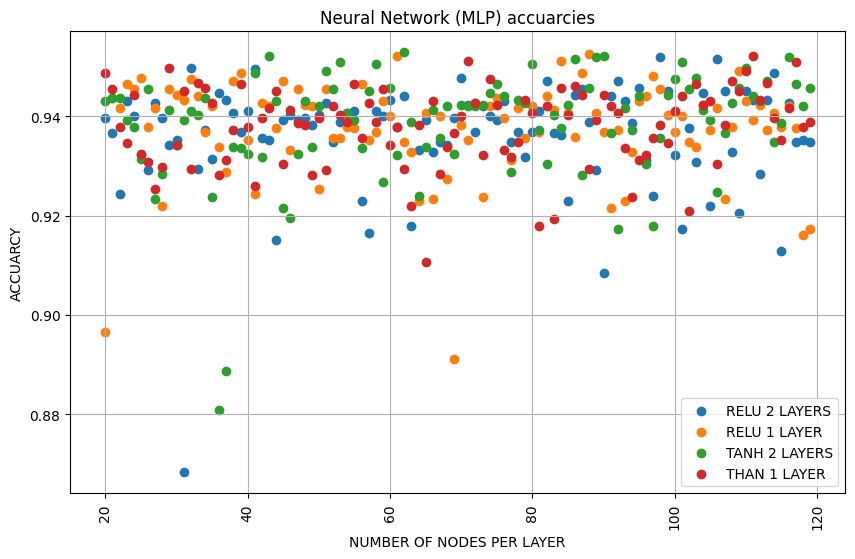

In [51]:
plt.figure(figsize=(10,6))
plt.title("Neural Network (MLP) accuarcies")
plt.scatter(no_nodes, accuarcies_2nodes, label="RELU 2 LAYERS")
plt.scatter(no_nodes, accuarcies_1nodes, label="RELU 1 LAYER")
plt.scatter(no_nodes, accuarcies_tanh2nodes, label="TANH 2 LAYERS")
plt.scatter(no_nodes, accuarcies_tanh1nodes, label="THAN 1 LAYER")
plt.xlabel("NUMBER OF NODES PER LAYER")
plt.ylabel("ACCUARCY")
plt.xticks(rotation=90)
plt.legend()
plt.grid(True)

plt.show()

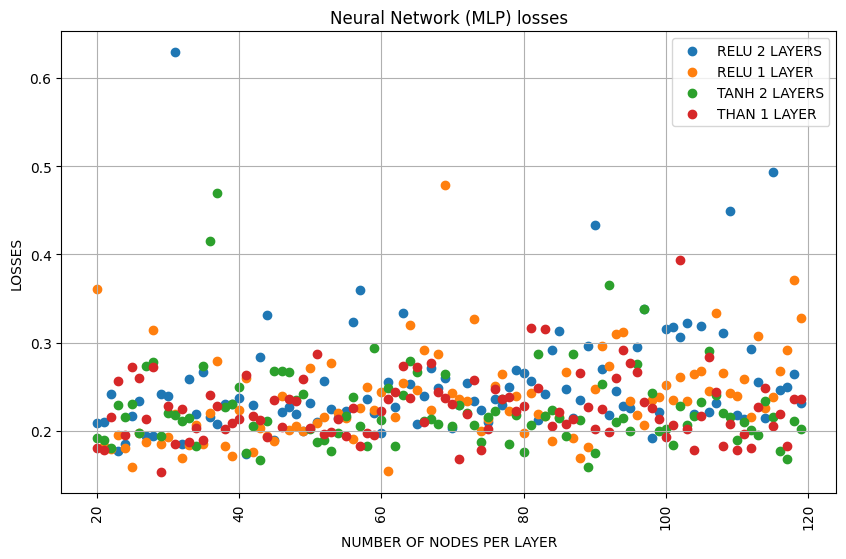

In [52]:
plt.figure(figsize=(10,6))
plt.title("Neural Network (MLP) losses")
plt.scatter(no_nodes, losses_2nodes, label="RELU 2 LAYERS")
plt.scatter(no_nodes, losses_1nodes, label="RELU 1 LAYER")
plt.scatter(no_nodes, losses_tanh2nodes, label="TANH 2 LAYERS")
plt.scatter(no_nodes, losses_tanh1nodes, label="THAN 1 LAYER")
plt.xlabel("NUMBER OF NODES PER LAYER")
plt.ylabel("LOSSES")
plt.xticks(rotation=90)
plt.legend()
plt.grid(True)

plt.show()